In [1]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')
p_features_cut=cuts['p_features_cut'][0]


# Task 16: How  many clumps are there?
Previous task: 

Task 01: Is the galaxy smooth or featured? (need to answer features)

Task 12: Does the galaxy have a mostly clumpy appearance? (need to answer yes) 

In [3]:
#First define the task in question:
p_1 = 't16_clumps_count_a01_1_weighted_fraction' # vote fraction for task
p_2 = 't16_clumps_count_a01_1_weighted_fraction'
p_3 = 't16_clumps_count_a03_3_weighted_fraction'
p_4 = 't16_clumps_count_a04_4_weighted_fraction' 
p_m4 = 't16_clumps_count_a05_more_than_4_fraction'
p_ct = 't16_clumps_count_a06_cant_tell_weighted_fraction'
N_clump_number = 't16_clumps_count_total_weight' # number of votes for task
#and the previous task vote fractions:

p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' # vote fraction for previous task
p_clumpy_yes = 't12_clumpy_a01_yes_weighted_fraction' # vote fraction for previous task
N_clumpy = 't12_clumpy_total_weight' # number of votes for previous task

#cut on p_features:
featured=(data[p_features]>p_features_cut)

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_clumpy]>=N_cut)

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_1=[]
err_list_1=[]
fraction_list_2=[]
err_list_2=[]
fraction_list_3=[]
err_list_3=[]
fraction_list_4=[]
err_list_4=[]
fraction_list_m4=[]
err_list_m4=[]
fraction_list_ct=[]
err_list_ct=[]

for p in p_prev_task_list:
    task_data = (data[p_clumpy_yes]>p-.05) & (data[p_clumpy_yes]<p+.05) & min_N & featured

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_1.append(np.nanmean(data[task_data][p_1]))
    fraction_list_2.append(np.nanmean(data[task_data][p_2]))
    fraction_list_3.append(np.nanmean(data[task_data][p_3]))
    fraction_list_4.append(np.nanmean(data[task_data][p_4]))
    fraction_list_m4.append(np.nanmean(data[task_data][p_m4]))
    fraction_list_ct.append(np.nanmean(data[task_data][p_ct]))


    try:
        err_list_1.append(np.nanstd(data[task_data][p_1])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_1.append(0)
    try:
        err_list_2.append(np.nanstd(data[task_data][p_2])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_2.append(0)
    try:
        err_list_3.append(np.nanstd(data[task_data][p_3])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_3.append(0)
    try:
        err_list_4.append(np.nanstd(data[task_data][p_4])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_4.append(0)
    try:
        err_list_m4.append(np.nanstd(data[task_data][p_m4])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_m4.append(0)
    try:
        err_list_ct.append(np.nanstd(data[task_data][p_ct])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_ct.append(0)

y1_1 = [f+e for f,e in zip(fraction_list_1,err_list_1)]
y2_1 = [f-e for f,e in zip(fraction_list_1,err_list_1)]

y1_2 = [f+e for f,e in zip(fraction_list_2,err_list_2)]
y2_2 = [f-e for f,e in zip(fraction_list_2,err_list_2)]

y1_3 = [f+e for f,e in zip(fraction_list_3,err_list_3)]
y2_3 = [f-e for f,e in zip(fraction_list_3,err_list_3)]

y1_4 = [f+e for f,e in zip(fraction_list_4,err_list_4)]
y2_4 = [f-e for f,e in zip(fraction_list_4,err_list_4)]

y1_m4 = [f+e for f,e in zip(fraction_list_m4,err_list_m4)]
y2_m4 = [f-e for f,e in zip(fraction_list_m4,err_list_m4)]

y1_ct = [f+e for f,e in zip(fraction_list_ct,err_list_ct)]
y2_ct = [f-e for f,e in zip(fraction_list_ct,err_list_ct)]

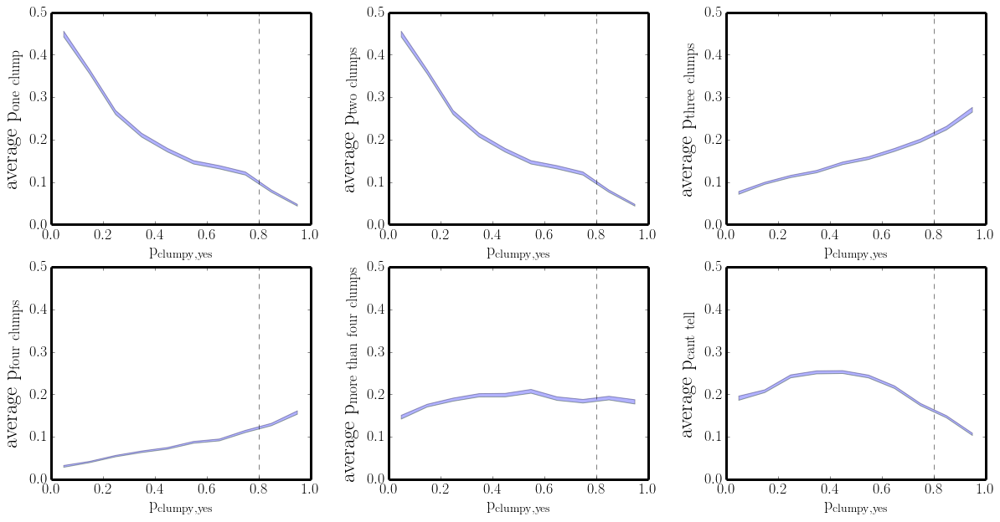

In [17]:
p_clumpy_yes_cut = .8

plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(20,10))
gs=gridspec.GridSpec(2,3)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_1,alpha=.1)
plt.plot(p_prev_task_list,y2_1,alpha=.1)
plt.fill_between(p_prev_task_list,y1_1,y2_1,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{one~clump}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=p_clumpy_yes_cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[0,1])
plt.plot(p_prev_task_list,y1_2,alpha=.1)
plt.plot(p_prev_task_list,y2_2,alpha=.1)
plt.fill_between(p_prev_task_list,y1_2,y2_2,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{two~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=p_clumpy_yes_cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[0,2])
plt.plot(p_prev_task_list,y1_3,alpha=.1)
plt.plot(p_prev_task_list,y2_3,alpha=.1)
plt.fill_between(p_prev_task_list,y1_3,y2_3,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{three~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=p_clumpy_yes_cut,ls='dashed',color='k',alpha=.5)


plt.subplot(gs[1,0])
plt.plot(p_prev_task_list,y1_4,alpha=.1)
plt.plot(p_prev_task_list,y2_4,alpha=.1)
plt.fill_between(p_prev_task_list,y1_4,y2_4,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{four~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=p_clumpy_yes_cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[1,1])
plt.plot(p_prev_task_list,y1_m4,alpha=.1)
plt.plot(p_prev_task_list,y2_m4,alpha=.1)
plt.fill_between(p_prev_task_list,y1_m4,y2_m4,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{more~than~four~clumps}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=p_clumpy_yes_cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[1,2])
plt.plot(p_prev_task_list,y1_ct,alpha=.1)
plt.plot(p_prev_task_list,y2_ct,alpha=.1)
plt.fill_between(p_prev_task_list,y1_ct,y2_ct,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{cant~tell}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,yes}}$',fontsize=20)
plt.axvline(x=p_clumpy_yes_cut,ls='dashed',color='k',alpha=.5)


## Below: Visually inspect galaxies for "clump number candidates" - galaxies for which asking the clump number question makes physical sense. These should be clumpy.

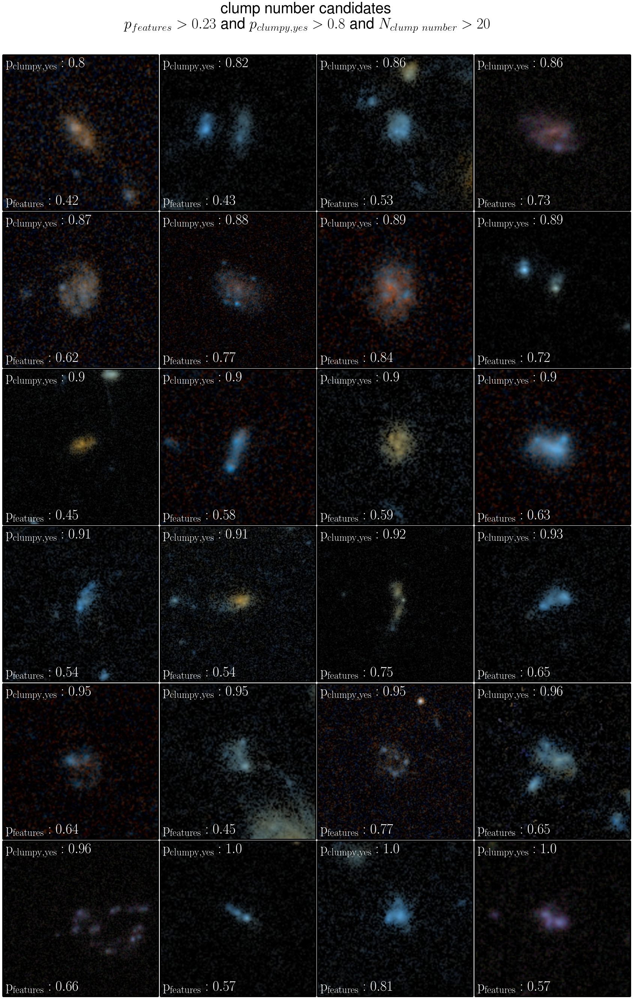

In [18]:
clumpy=(data[p_clumpy_yes]>p_clumpy_yes_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & clumpy & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_clumpy_yes, column 111
random_gal_list.sort(key=itemgetter(111))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{clumpy,yes}: %s}$'%round(gal[p_clumpy_yes],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{features}: %s}$'%round(gal[p_features],2),fontsize=38,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'clump number candidates\n$p_{features} > %s$~and~$p_{clumpy,yes}>%s$ and $N_{clump~number}>20$'%(p_features_cut,p_clumpy_yes_cut), fontsize=40,ha='center')





## Below: The control sample; galaxies for which asking the clump number question does *not* make sense. These should have no clumps. 

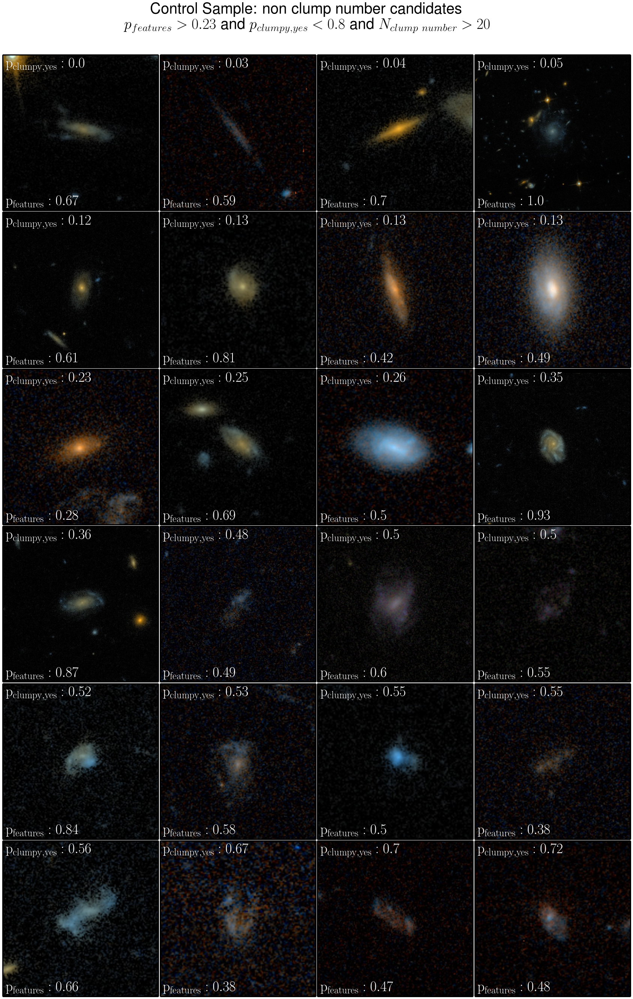

In [19]:
not_clumpy=(data[p_clumpy_yes]<p_clumpy_yes_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & not_clumpy & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_clumpy_yes, column 111
random_gal_list.sort(key=itemgetter(111))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{clumpy,yes}: %s}$'%round(gal[p_clumpy_yes],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{features}: %s}$'%round(gal[p_features],2),fontsize=38,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non clump number candidates\n$p_{features} > %s$~and~$p_{clumpy,yes}<%s$ and $N_{clump~number}>20$'%(p_features_cut,p_clumpy_yes_cut), fontsize=40,ha='center')





In [20]:
cuts['p_clumpy_yes_cut']=p_clumpy_yes_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')